<a href="https://colab.research.google.com/github/khushalbisani/Urban-Sound-Classification-Btech-Project/blob/master/Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install numpy
!pip install helpers
!pip install soundfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from keras.layers import Activation, Dense, Dropout, Conv2D, Flatten, MaxPooling2D ,GlobalAveragePooling2D
from keras.models import Sequential
import random
import librosa
import librosa.display
import os
import  IPython.display as ipd
from scipy.io import wavfile as wav
import helpers
import soundfile as sf
%matplotlib inline

Using TensorFlow backend.


In [0]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
! free -m

              total        used        free      shared  buff/cache   available
Mem:          13022         676       10100           0        2246       12079
Swap:             0           0           0


In [0]:
!ls "/content/drive/My Drive"

'Colab Notebooks'
'Getting started.pdf'
 Noisy_Sound_Classification
'NOISY SOUND CLASSIFICATION USING DEEP LEARNING.gdoc'
 Report.gdoc
'Untitled Diagram.drawio'


In [0]:
os.chdir("/content/drive/My Drive/Noisy_Sound_Classification")

#!unzip UrbanSound8K.zip

In [0]:
path = "/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/"
data = pd.read_csv(path + "metadata/UrbanSound8K.csv")
data.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [0]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8732 entries, 0 to 8731
Data columns (total 8 columns):
slice_file_name    8732 non-null object
fsID               8732 non-null int64
start              8732 non-null float64
end                8732 non-null float64
salience           8732 non-null int64
fold               8732 non-null int64
classID            8732 non-null int64
class              8732 non-null object
dtypes: float64(2), int64(4), object(2)
memory usage: 545.8+ KB


In [0]:
valid_data = data[["slice_file_name","salience","fold","classID","class"]][data['end'] - data['start'] >= 3]
valid_data.shape

(7468, 5)

In [0]:
valid_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7468 entries, 1 to 8729
Data columns (total 5 columns):
slice_file_name    7468 non-null object
salience           7468 non-null int64
fold               7468 non-null int64
classID            7468 non-null int64
class              7468 non-null object
dtypes: int64(3), object(2)
memory usage: 350.1+ KB


In [0]:
valid_data.head()

,slice_file_name,salience,fold,classID,class
1,100263-2-0-117.wav,1,5,2,children_playing
2,100263-2-0-121.wav,1,5,2,children_playing
3,100263-2-0-126.wav,1,5,2,children_playing
4,100263-2-0-137.wav,1,5,2,children_playing
5,100263-2-0-143.wav,1,5,2,children_playing


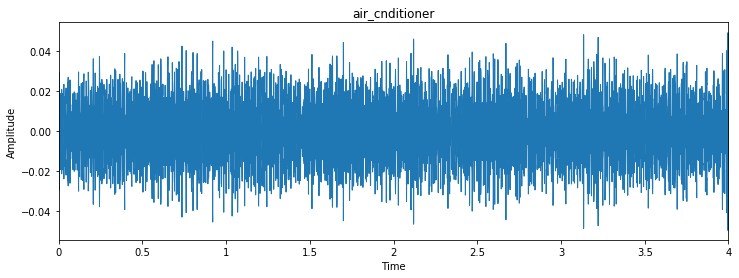

In [0]:
# sound : air_cnditioner
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/151977-0-0-8.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("air_cnditioner")
ipd.Audio(path + "audio/fold1/151977-0-0-8.wav")

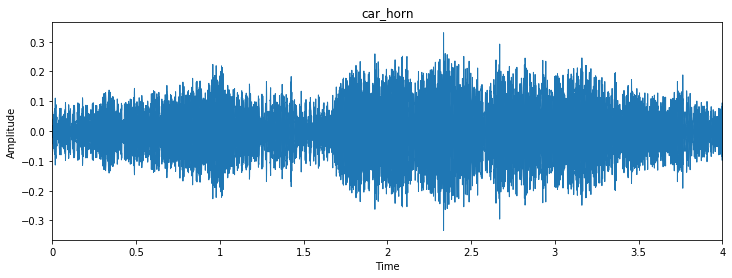

In [0]:
# sound : car_horn
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/24074-1-0-4.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("car_horn")
ipd.Audio(path + "audio/fold1/24074-1-0-4.wav")

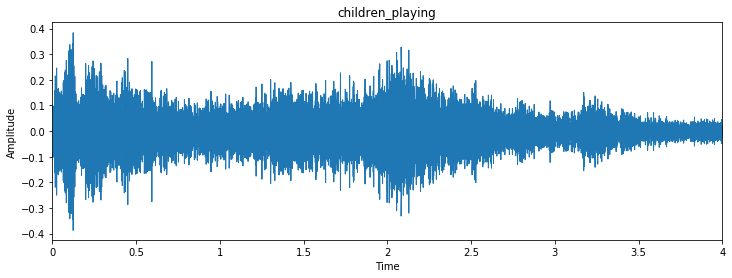

In [0]:
# sound : children_playing
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/15564-2-0-2.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("children_playing")
ipd.Audio(path + "audio/fold1/15564-2-0-2.wav")

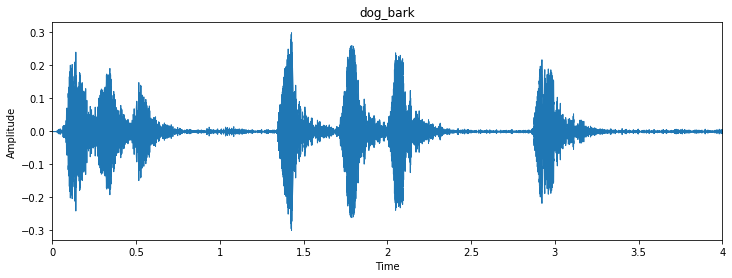

In [0]:
# sound : dog_bark
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/7383-3-0-0.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("dog_bark")
ipd.Audio(path + "audio/fold1/7383-3-0-0.wav")

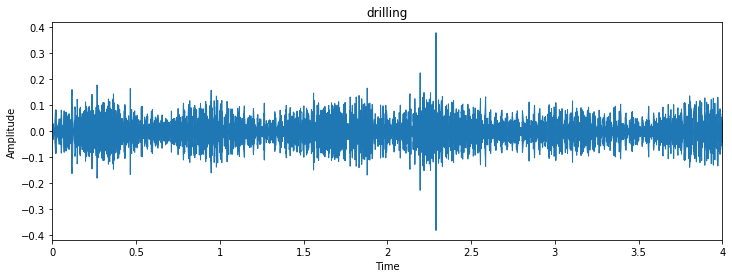

In [0]:
# sound : drilling
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/17913-4-0-2.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("drilling")
ipd.Audio(path + "audio/fold1/17913-4-0-2.wav")

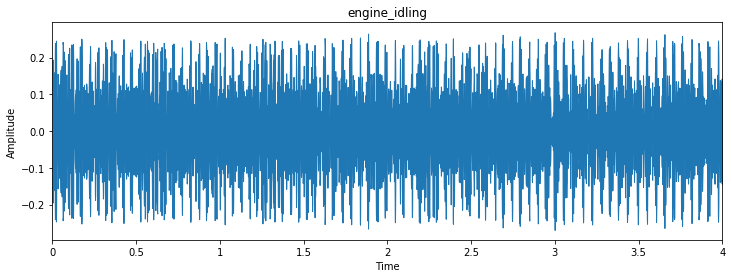

In [0]:
# sound : engine_idling
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/146186-5-0-7.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("engine_idling")
ipd.Audio(path + "audio/fold1/146186-5-0-7.wav")

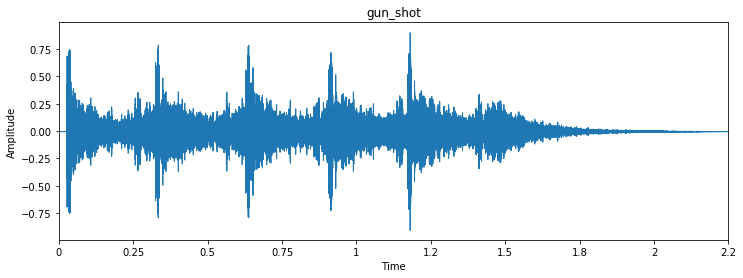

In [0]:
# sound : gun_shot 
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/7061-6-0-0.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("gun_shot")
ipd.Audio(path + "audio/fold1/7061-6-0-0.wav")

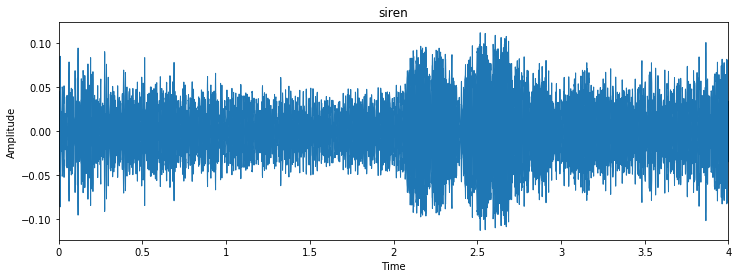

In [0]:
# sound : siren
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/30823-8-0-0.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("siren")
ipd.Audio(path + "audio/fold1/30823-8-0-0.wav")

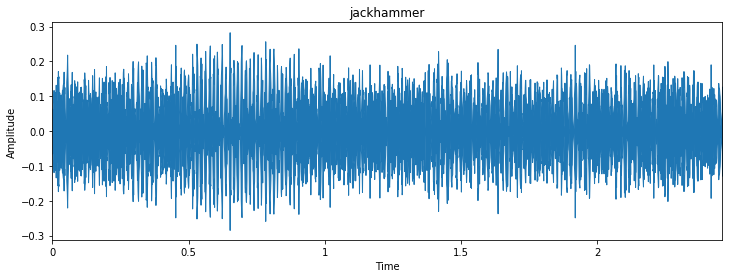

In [0]:
# sound : jackhammer
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/174276-7-1-0.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("jackhammer")
ipd.Audio(path + "audio/fold1/174276-7-1-0.wav")

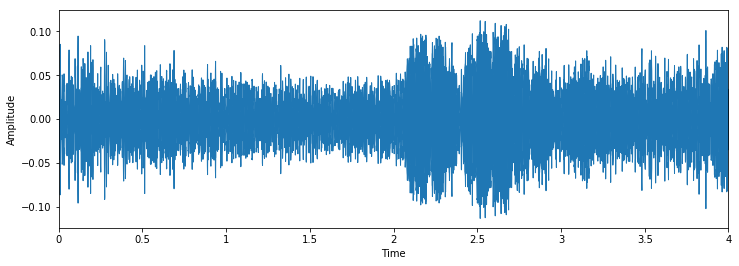

In [0]:
# sound : siren
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/30823-8-0-0.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("")
ipd.Audio(path + "audio/fold1/30823-8-0-0.wav")

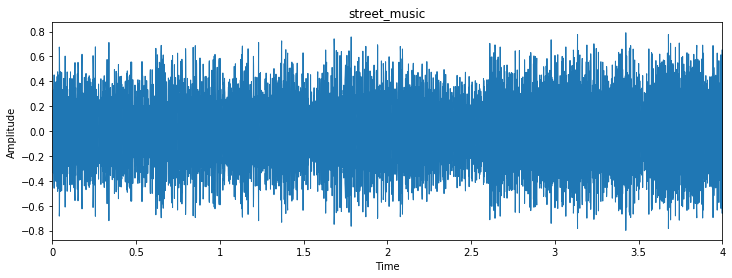

In [0]:
# sound : street_music
plt.figure(figsize=(12,4))
y , sr = librosa.load(path + "audio/fold1/26270-9-0-3.wav")
librosa.display.waveplot(y = y , sr = sr)
plt.ylabel("Amplitude")
plt.title("street_music")
ipd.Audio(path + "audio/fold1/26270-9-0-3.wav")

In [0]:
data['class'].value_counts()

air_conditioner     1000
jackhammer          1000
drilling            1000
children_playing    1000
engine_idling       1000
street_music        1000
dog_bark            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

In [0]:
ipd.Audio(path + "audio/fold1/26270-9-0-3.wav")

In [0]:
ob = sf.SoundFile(path + "audio/fold5/100032-3-0-0.wav")
print('Sample rate: ',ob.samplerate)
print('Channels: ',ob.channels)
print('Subtype: ',ob.subtype)
print(ob)

Sample rate:  44100
Channels:  2
Subtype:  PCM_16
SoundFile('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/audio/fold5/100032-3-0-0.wav', mode='r', samplerate=44100, channels=2, format='WAV', subtype='PCM_16', endian='FILE')


In [0]:

# num_channel = []
# sample_rate = []
# bit_rate = []

# for ind , row in data.iterrows():
    
# #     file_name = os.path.join(os.path.abspath('audio/'),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
#     file_name = os.path.join(path+'audio/fold'+str(row["fold"])+'/'+str(row["slice_file_name"]))
#     detail = sf.SoundFile(file_name)
#     num_channel.append(detail.channels)
#     sample_rate.append(detail.samplerate)
#     bit_rate.append(detail.subtype)
#     if ind%2==0:
#        print(ind)
   

# new_data = pd.DataFrame({
#     'num_channel' : num_channel , 'sample_rate' : sample_rate , 'bit_rate' : bit_rate
# })


In [0]:
# new_data.head()

In [0]:
# new_data['num_channel'].value_counts()

In [0]:
# new_data['sample_rate'].value_counts()

In [0]:
# new_data['bit_rate'].value_counts()

In [0]:
l_y , l_sr  = librosa.load(path + "audio/fold1/26270-9-0-3.wav")
s_sr , s_y = wav.read(path + "audio/fold1/26270-9-0-3.wav")

print("Original Sample rate :" , s_sr)
print("Librosa sample rate :" , l_sr)

Original Sample rate : 48000
Librosa sample rate : 22050


In [0]:
print('Original audio file range:', np.min(s_y), 'to', np.max(s_y))
print('Librosa audio file range:', np.min(l_y), 'to', np.max(l_y))

Original audio file range: -27426 to 28690
Librosa audio file range: -0.7784092 to 0.7946713


In [0]:
l_y , l_sr  = librosa.core.load(path + "audio/fold3/17853-5-0-6.wav")
s_y, s_sr = librosa.core.load(path + "audio/fold3/17853-5-0-6.wav" , mono=False)
ipd.Audio(path + "audio/fold2/27349-3-2-1.wav")

Text(0.5, 0, 'Time(s)')

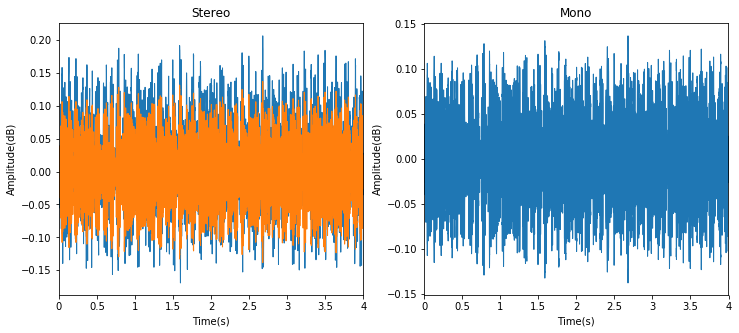

In [0]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
librosa.display.waveplot(y = s_y , sr = s_sr)
librosa.display.waveplot(y = l_y , sr = l_sr)
plt.title("Stereo")
plt.ylabel("Amplitude(dB)")
plt.xlabel("Time(s)")
plt.subplot(1,2,2)
librosa.display.waveplot(y = l_y , sr = l_sr)
plt.ylabel("Amplitude(dB)")
plt.title("Mono")
plt.xlabel("Time(s)")

In [0]:
l_y , l_sr  = librosa.core.load(path + "audio/fold2/27349-3-2-1.wav")
mfccs = librosa.feature.mfcc(y=l_y, sr=l_sr, n_mfcc=40)
print(mfccs.shape)
mfccscale = np.mean(mfccs.T , axis = 0)
print(mfccscale.shape)

(40, 173)
(40,)


In [0]:
mfccs

array([[-2.77631077e+02, -2.79902746e+02, -2.80952826e+02, ...,
        -2.53521900e+02, -2.48555806e+02, -2.57442133e+02],
       [ 7.86227327e+01,  9.12277786e+01,  9.27514016e+01, ...,
         9.97092478e+01,  1.03448172e+02,  9.71682725e+01],
       [ 2.16355529e+00, -2.48685635e+00, -3.50844071e+00, ...,
        -4.72762348e+01, -4.30687502e+01, -3.80423306e+01],
       ...,
       [ 4.26094581e+00,  1.91048022e+00,  4.56350521e+00, ...,
        -1.51643499e+00, -5.07481426e-01,  1.32188084e-01],
       [ 1.79244485e-01, -2.12061065e+00, -4.51918390e+00, ...,
         3.33896010e+00, -4.33086200e-01,  3.81401112e+00],
       [ 2.17028304e+00,  5.43616722e-01,  3.30150033e+00, ...,
         9.86021101e+00,  7.53017400e+00,  6.43738285e+00]])

In [0]:
mfccscale

array([-2.87420312e+02,  1.04557067e+02, -2.35540211e+01,  1.89887619e+01,
       -3.53880799e+01, -5.66854296e+00,  3.09603596e-01, -4.13843984e+00,
       -1.02490853e+01, -1.87402644e+00, -8.43840220e+00,  4.68599600e-01,
       -8.92212427e+00,  1.59198458e+00, -2.68234098e+00, -3.77598097e-01,
       -3.82188367e+00,  1.40040003e+00, -7.23732499e+00, -2.65921115e+00,
       -1.92638325e+00,  2.61408800e+00, -7.08108525e+00, -4.48496007e+00,
       -4.31012956e+00, -4.71112061e-01, -2.91751048e+00, -1.24380538e+00,
       -1.82249641e+00,  1.15225396e+00, -4.97662882e+00, -3.57451721e+00,
       -3.90350706e+00,  1.08882088e-02, -3.70564124e+00,  1.78329566e+00,
       -2.24759761e+00, -3.83355648e-01, -2.31273719e+00,  2.67615471e+00])

Text(0, 0.5, 'MFCC coefficient')

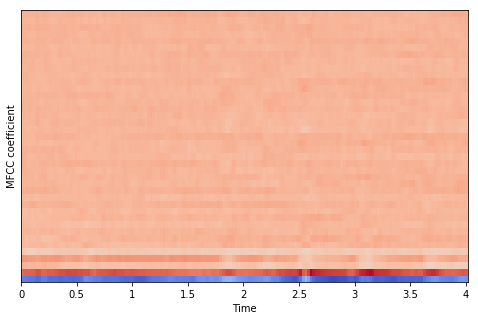

In [0]:
plt.figure(figsize=(8,5))
librosa.display.specshow(mfccs, sr=l_sr, x_axis='time')
plt.ylabel("MFCC coefficient")
plt.xlabel("Time(s)")

In [0]:
mspec = librosa.feature.melspectrogram(y=l_y, sr=l_sr)
print(mspec.shape)

(128, 173)


In [0]:
!pip install nlpaug
import nlpaug
from nlpaug.util.file.load import LoadUtil
from nlpaug.util.visual.spectrogram import VisualSpectrogram



     |████████████████████████████████| 81kB 32.4MB/s 


In [0]:
path1 = path + "audio/fold2/27349-3-2-1.wav"

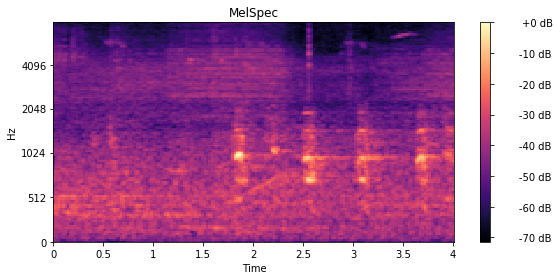

Text(0, 0.5, 'Frequency(Hz)')

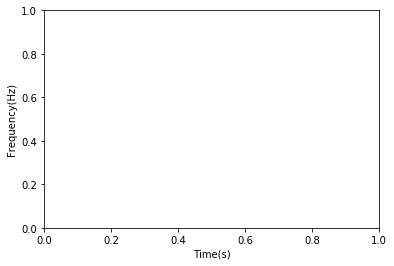

In [0]:
mel_spectrogram = LoadUtil.load_mel_spectrogram(path1, n_mels=128)
VisualSpectrogram.visual('MelSpec', mel_spectrogram)
plt.xlabel("Time(s)")
plt.ylabel("Frequency(Hz)")

In [0]:
print(mel_spectrogram.shape)

(128, 173)


In [0]:
import nlpaug.augmenter.spectrogram as nas
import nlpaug.flow as naf

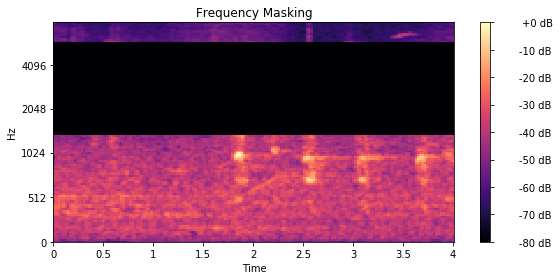

In [0]:
aug = nas.FrequencyMaskingAug(mask_factor=80)

augmented_mel_spectrogram = aug.substitute(mel_spectrogram)
VisualSpectrogram.visual('Frequency Masking', augmented_mel_spectrogram)

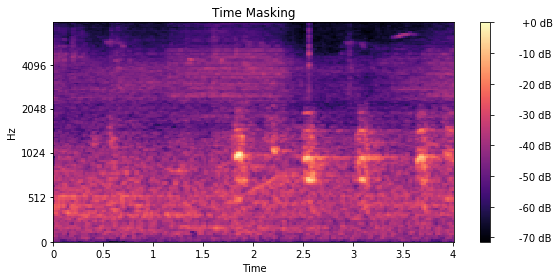

In [0]:

aug = nas.TimeMaskingAug(mask_factor=80)

augmented_mel_spectrogram = aug.substitute(mel_spectrogram)
VisualSpectrogram.visual('Time Masking', augmented_mel_spectrogram)

Text(0.5, 1.0, 'MFCC')

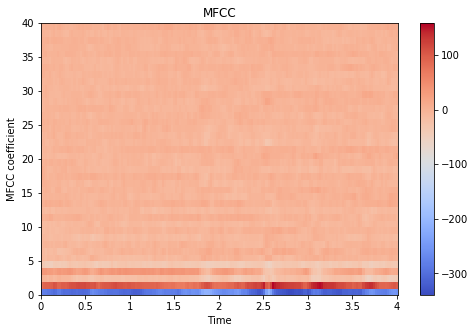

In [0]:

plt.figure(figsize=(8,5))
librosa.display.specshow(mfccs, sr=l_sr, x_axis='time',y_axis='frames' )
plt.ylabel("MFCC coefficient")
plt.colorbar()
plt.title("MFCC")

In [0]:
melspec_train_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/melspec_train_acc.npy')
melspec_test_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/melspec_test_acc.npy')
melspec_train_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/melspec_train_loss.npy')
melspec_test_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/melspec_test_loss.npy')

In [0]:
mfcc_train_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/mfcc_train_acc.npy')
mfcc_test_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/mfcc_test_acc.npy')
mfcc_train_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/mfcc_train_loss.npy')
mfcc_test_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/mfcc_test_loss.npy')

In [0]:
tm_train_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/tm_train_acc.npy')
tm_test_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/tm_test_acc.npy')
tm_train_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/tm_train_loss.npy')
tm_test_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/tm_test_loss.npy')

In [0]:
fm_train_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/fm_train_acc.npy')
fm_test_acc = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/fm_test_acc.npy')
fm_train_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/fm_train_loss.npy')
fm_test_loss = np.load('/content/drive/My Drive/Noisy_Sound_Classification/UrbanSound8K/fm_test_loss.npy')

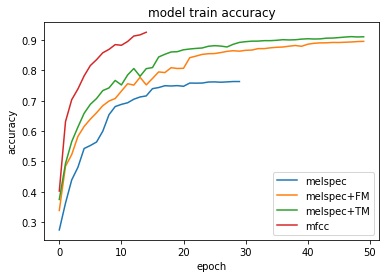

In [0]:
plt.plot(melspec_train_acc)
plt.plot(fm_train_acc)
plt.plot(tm_train_acc)
plt.plot(mfcc_train_acc)
plt.title('model train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['melspec','melspec+FM','melspec+TM','mfcc',], loc='lower right')
plt.show()

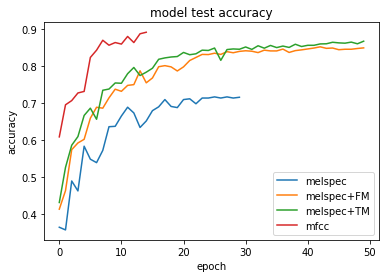

In [0]:
plt.plot(melspec_test_acc)
plt.plot(fm_test_acc)
plt.plot(tm_test_acc)
plt.plot(mfcc_test_acc)
plt.title('model test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['melspec','melspec+FM','melspec+TM','mfcc',], loc='lower right')
plt.show()

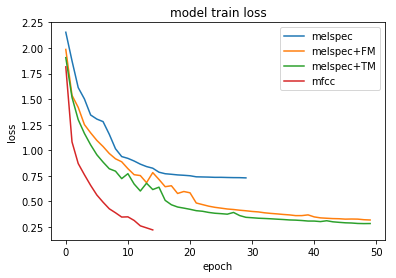

In [0]:
plt.plot(melspec_train_loss)
plt.plot(fm_train_loss)
plt.plot(tm_train_loss)
plt.plot(mfcc_train_loss)
plt.title('model train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['melspec','melspec+FM','melspec+TM','mfcc',], loc='upper right')
plt.show()

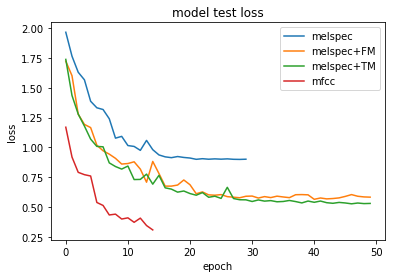

In [0]:
plt.plot(melspec_test_loss)
plt.plot(fm_test_loss)
plt.plot(tm_test_loss)
plt.plot(mfcc_test_loss)
plt.title('model test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['melspec','melspec+FM','melspec+TM','mfcc',], loc='upper right')
plt.show()